In [1]:
%cd drive/My\ Drive/covid19
!ls

/content/drive/My Drive/covid19
model.pt  tr_im.nii  tr_mask.nii  val_im.nii


In [0]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
import random
import torch
import torch.nn as nn
import torch.nn.functional as F
from matplotlib.colors import LinearSegmentedColormap

In [0]:
def labels_to_mask(label):
  h=label.shape[0]
  w=label.shape[1]
  masks=np.zeros([h,w,4])    
  for r in range(h):
    for c in range(w):
      masks[r,c,int(label[r,c])]=1.0
  return masks

def masks_to_labels(masks):
  h=masks.shape[0]
  w=masks.shape[1]
  labels=np.zeros([h,w],dtype='int32')
  for c in range(4):
    for i in range(h):
      for j in range(w):
        if masks[i,j,c]==1:
          labels[i,j]=c
  return labels

def dice_coef(y_true,y_pred,smooth=1):
  numer=2*torch.sum(y_pred*y_true)
  denom=torch.sum(y_true+y_pred)
  coef=(numer+smooth)/(denom+smooth)
  return coef.item()

In [4]:
x_train=nib.load('tr_im.nii')
x_train=np.array(x_train.dataobj)
x_train=np.swapaxes(x_train,1,2)
x_train=np.swapaxes(x_train,0,1)

y_train=nib.load('tr_mask.nii')
y_train=np.array(y_train.dataobj)
y_train=np.swapaxes(y_train,1,2)
y_train=np.swapaxes(y_train,0,1)

x_val=x_train[90:100]
y_val=y_train[90:100]

x_train=x_train[0:90]
y_train=y_train[0:90]

x_test=nib.load('val_im.nii')
x_test=np.array(x_test.dataobj)
x_test=np.swapaxes(x_test,1,2)
x_test=np.swapaxes(x_test,0,1)
print(x_train.shape,y_train.shape,x_val.shape,y_val.shape,x_test.shape)

(90, 512, 512) (90, 512, 512) (10, 512, 512) (10, 512, 512) (10, 512, 512)


In [0]:
idx_train=list(range(0,len(x_train)))
idx_train=np.array(idx_train)
np.random.shuffle(idx_train)

idx_val=list(range(0,len(x_val)))
idx_val=np.array(idx_val)
np.random.shuffle(idx_val)

In [0]:
colors=[(0,0,0),(1,0,0),(0,1,0),(0,0,1)]
cm=LinearSegmentedColormap.from_list('rgb_cmap',colors,N=4)

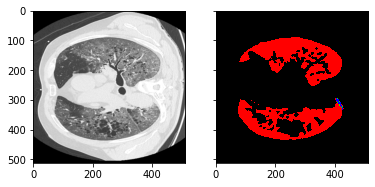

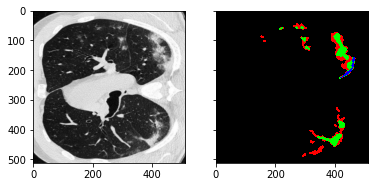

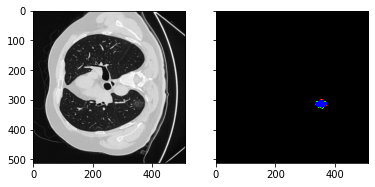

In [7]:
idx1=random.randint(0,x_train.shape[0])
idx2=random.randint(0,x_train.shape[0])
idx3=random.randint(0,x_train.shape[0])
f1,(ax1,ax2)=plt.subplots(1,2,sharey=True)
ax1.imshow(x_train[idx_train[idx1],:,:],cmap='gray')
ax2.imshow(y_train[idx_train[idx1],:,:],cmap=cm)
f2,(ax1,ax2)=plt.subplots(1,2,sharey=True)
ax1.imshow(x_train[idx_train[idx2],:,:],cmap='gray')
ax2.imshow(y_train[idx_train[idx2],:,:],cmap=cm)
f3,(ax1,ax2)=plt.subplots(1,2,sharey=True)
ax1.imshow(x_train[idx_train[idx3],:,:],cmap='gray')
ax2.imshow(y_train[idx_train[idx3],:,:],cmap=cm)

In [8]:
labels=[]
for i in range(len(y_train)):
  labels.append(labels_to_mask(y_train[i,:,:]))
y_train=np.array(labels)

labels=[]
for i in range(len(y_val)):
  labels.append(labels_to_mask(y_val[i,:,:]))
y_val=np.array(labels)

print(x_train.shape,y_train.shape,x_val.shape,y_val.shape)

(90, 512, 512) (90, 512, 512, 4) (10, 512, 512) (10, 512, 512, 4)


In [0]:
learning_rate=0.0001
epochs=45
batch_size=2
n_batches=int(len(x_train)/batch_size)

In [0]:
train_batches=[]
for i in range(n_batches):
  images=[]
  gt=[]
  for j in range(i*batch_size,(i+1)*batch_size):
    images.append(np.expand_dims(x_train[idx_train[j],:,:],axis=0))
    temp=y_train[idx_train[j],:,:,:]
    temp=np.moveaxis(temp,-1,0)
    gt.append(temp)
  batch={'images':torch.tensor(np.array(images,dtype=np.float32)),'gt':torch.tensor(np.array(gt,dtype=np.float32))}
  train_batches.append(batch)

val_batches=[]
for i in range(int(len(x_val)/batch_size)):
  v_images=[]
  v_gt=[]
  for j in range(i*batch_size,(i+1)*batch_size):
    v_images.append(np.expand_dims(x_val[idx_val[j],:,:],axis=0))
    temp=y_val[idx_val[j],:,:,:]
    temp=np.moveaxis(temp,-1,0)
    v_gt.append(temp)
  batch={'images':torch.tensor(np.array(v_images,dtype=np.float32)),'gt':torch.tensor(np.array(v_gt,dtype=np.float32))}
  val_batches.append(batch)

In [0]:
class SegNetWithSkipConnections(nn.Module):
  def __init__(self):
    super(SegNetWithSkipConnections,self).__init__()
    self.conv1_1=nn.Conv2d(1,64,kernel_size=3,stride=1,padding=1)
    self.conv1_2=nn.Conv2d(64,64,kernel_size=3,stride=1,padding=1)

    self.conv2_1=nn.Conv2d(64,128,kernel_size=3,stride=1,padding=1)
    self.conv2_2=nn.Conv2d(128,128,kernel_size=3,stride=1,padding=1)

    self.conv3_1=nn.Conv2d(128,256,kernel_size=3,stride=1,padding=1)
    self.conv3_2=nn.Conv2d(256,256,kernel_size=3,stride=1,padding=1)
    self.conv3_3=nn.Conv2d(256,256,kernel_size=3,stride=1,padding=1)

    self.conv4_1=nn.Conv2d(256,512,kernel_size=3,stride=1,padding=1)
    self.conv4_2=nn.Conv2d(512,512,kernel_size=3,stride=1,padding=1)
    self.conv4_3=nn.Conv2d(512,512,kernel_size=3,stride=1,padding=1)

    self.conv5_1=nn.Conv2d(512,512,kernel_size=3,stride=1,padding=1)
    self.conv5_2=nn.Conv2d(512,512,kernel_size=3,stride=1,padding=1)
    self.conv5_3=nn.Conv2d(512,512,kernel_size=3,stride=1,padding=1)

    self.upconv5_3=nn.Conv2d(512,512,kernel_size=3,stride=1,padding=1)
    self.upconv5_2=nn.Conv2d(512,512,kernel_size=3,stride=1,padding=1)
    self.upconv5_1=nn.Conv2d(512,512,kernel_size=3,stride=1,padding=1)

    self.upconv4_3=nn.Conv2d(1024,512,kernel_size=3,stride=1,padding=1)
    self.upconv4_2=nn.Conv2d(512,512,kernel_size=3,stride=1,padding=1)
    self.upconv4_1=nn.Conv2d(512,256,kernel_size=3,stride=1,padding=1)

    self.upconv3_3=nn.Conv2d(512,256,kernel_size=3,stride=1,padding=1)
    self.upconv3_2=nn.Conv2d(256,256,kernel_size=3,stride=1,padding=1)
    self.upconv3_1=nn.Conv2d(256,128,kernel_size=3,stride=1,padding=1)

    self.upconv2_2=nn.Conv2d(256,128,kernel_size=3,stride=1,padding=1)
    self.upconv2_1=nn.Conv2d(128,64,kernel_size=3,stride=1,padding=1)

    self.upconv1_2=nn.Conv2d(128,64,kernel_size=3,stride=1,padding=1)
    self.upconv1_1=nn.Conv2d(64,4,kernel_size=3,stride=1,padding=1)

    self.pool1=nn.MaxPool2d(kernel_size=2,stride=2,return_indices=True)
    self.pool2=nn.MaxPool2d(kernel_size=2,stride=2,return_indices=True)
    self.pool3=nn.MaxPool2d(kernel_size=2,stride=2,return_indices=True)
    self.pool4=nn.MaxPool2d(kernel_size=2,stride=2,return_indices=True)
    self.pool5=nn.MaxPool2d(kernel_size=2,stride=2,return_indices=True)

    self.upsamp5=nn.MaxUnpool2d(kernel_size=2,stride=2)
    self.upsamp4=nn.MaxUnpool2d(kernel_size=2,stride=2)
    self.upsamp3=nn.MaxUnpool2d(kernel_size=2,stride=2)
    self.upsamp2=nn.MaxUnpool2d(kernel_size=2,stride=2)
    self.upsamp1=nn.MaxUnpool2d(kernel_size=2,stride=2)

    self.batch_norm_1=nn.BatchNorm2d(64)
    self.batch_norm_2=nn.BatchNorm2d(128)
    self.batch_norm_3=nn.BatchNorm2d(256)
    self.batch_norm_4=nn.BatchNorm2d(512)
  
  def forward(self,x):
    #1,1
    dim1=x.size()
    x1=self.conv1_1(x)
    x1=self.batch_norm_1(x1)
    x1=F.relu(x1)
    x1=self.conv1_2(x1)
    x1=self.batch_norm_1(x1)
    x1=F.relu(x1)
    p1,idx1=self.pool1(x1)
    #64,1/2

    #64,1/2
    dim2=p1.size()
    x2=self.conv2_1(p1)
    x2=self.batch_norm_2(x2)
    x2=F.relu(x2)
    x2=self.conv2_2(x2)
    x2=self.batch_norm_2(x2)
    x2=F.relu(x2)
    p2,idx2=self.pool2(x2)
    #128,1/4

    #128,1/4
    dim3=p2.size()
    x3=self.conv3_1(p2)
    x3=self.batch_norm_3(x3)
    x3=F.relu(x3)
    x3=self.conv3_2(x3)
    x3=self.batch_norm_3(x3)
    x3=F.relu(x3)
    x3=self.conv3_3(x3)
    x3=self.batch_norm_3(x3)
    x3=F.relu(x3)
    p3,idx3=self.pool3(x3)
    #256,1/8

    #256,1/8
    dim4=p3.size()
    x4=self.conv4_1(p3)
    x4=self.batch_norm_4(x4)
    x4=F.relu(x4)
    x4=self.conv4_2(x4)
    x4=self.batch_norm_4(x4)
    x4=F.relu(x4)
    x4=self.conv4_3(x4)
    x4=self.batch_norm_4(x4)
    x4=F.relu(x4)
    p4,idx4=self.pool4(x4)
    #512,1/16

    #512,1/16
    dim5=p4.size()
    x5=self.conv5_1(p4)
    x5=self.batch_norm_4(x5)
    x5=F.relu(x5)
    x5=self.conv5_2(x5)
    x5=self.batch_norm_4(x5)
    x5=F.relu(x5)
    x5=self.conv5_3(x5)
    x5=self.batch_norm_4(x5)
    x5=F.relu(x5)
    p5,idx5=self.pool5(x5)
    #512,1/32   

    #512,1/32
    u5=self.upsamp5(p5,idx5,output_size=dim5)
    u5=self.upconv5_3(u5)
    u5=self.batch_norm_4(u5)
    u5=F.relu(u5)
    u5=self.upconv5_2(u5)
    u5=self.batch_norm_4(u5)
    u5=F.relu(u5)
    u5=self.upconv5_1(u5)
    u5=self.batch_norm_4(u5)
    u5=F.relu(u5)
    #512,1/16

    #512,1/16
    u4=self.upsamp4(u5,idx4,output_size=dim4)
    u4=torch.cat([u4,x4],dim=1)
    u4=self.upconv4_3(u4)
    u4=self.batch_norm_4(u4)
    u4=F.relu(u4)
    u4=self.upconv4_2(u4)
    u4=self.batch_norm_4(u4)
    u4=F.relu(u4)
    u4=self.upconv4_1(u4)
    u4=self.batch_norm_3(u4)
    u4=F.relu(u4)
    #256,1/8

    #256,1/8
    u3=self.upsamp3(u4,idx3,output_size=dim3)
    u3=torch.cat([u3,x3],dim=1)
    u3=self.upconv3_3(u3)
    u3=self.batch_norm_3(u3)
    u3=F.relu(u3)
    u3=self.upconv3_2(u3)
    u3=self.batch_norm_3(u3)
    u3=F.relu(u3)
    u3=self.upconv3_1(u3)
    u3=self.batch_norm_2(u3)
    u3=F.relu(u3)
    #128,1/4

    #128,1/4
    u2=self.upsamp2(u3,idx2,output_size=dim2)
    u2=torch.cat([u2,x2],dim=1)
    u2=self.upconv2_2(u2)
    u2=self.batch_norm_2(u2)
    u2=F.relu(u2)
    u2=self.upconv2_1(u2)
    u2=self.batch_norm_1(u2)
    u2=F.relu(u2)
    #64,1/2

    #64,1/2
    u1=self.upsamp1(u2,idx1,output_size=dim1)
    u1=torch.cat([u1,x1],dim=1)
    u1=self.upconv1_2(u1)
    u1=self.batch_norm_1(u1)
    u1=F.relu(u1)
    u1=self.upconv1_1(u1)
    u1=F.softmax(u1,dim=1)
    #4,1

    return u1

In [0]:
model=SegNetWithSkipConnections()
model.cuda()
criterion=nn.BCELoss()
optimiser=torch.optim.Adam(model.parameters(),lr=learning_rate)

In [13]:
train_loss_list=[]
val_loss_list=[]
train_dice_coef_list=[]
val_dice_coef_list=[]
for epoch in range(epochs):
  train_loss=0
  train_dice=0
  for i in range(len(train_batches)):
    batch=train_batches[i]
    images=batch['images']
    gt=batch['gt']
    pred=model(images.cuda())
    optimiser.zero_grad()
    loss=criterion(pred,gt.cuda())
    train_loss+=loss.item()
    loss.backward()
    optimiser.step()
    for k in range(batch_size):
      coef=dice_coef(gt[k,:,:,:],pred[k,:,:,:].cpu())
      train_dice+=coef
  avg_loss=train_loss/len(train_batches)
  train_loss_list.append(avg_loss)
  avg_train_dice_coef=train_dice/len(x_train)
  train_dice_coef_list.append(avg_train_dice_coef)

  val_loss=0
  val_dice=0
  for i in range(len(val_batches)):
    batch=val_batches[i]
    images=batch['images']
    gt=batch['gt']
    pred=model(images.cuda())
    loss=criterion(pred,gt.cuda())
    val_loss+=loss.item()
    for k in range(batch_size):
      coef=dice_coef(gt[k,:,:,:],pred[k,:,:,:].cpu())
      val_dice+=coef
  avg_val_loss=val_loss/len(val_batches)
  val_loss_list.append(avg_val_loss)
  avg_val_dice_coef=val_dice/len(x_val)
  val_dice_coef_list.append(avg_val_dice_coef)
  print('Epoch:',(epoch+1),'/',epochs,'loss:',avg_loss,'dice_coef:',avg_train_dice_coef,'val_loss:',avg_val_loss,'val_dice_coef:',avg_val_dice_coef)

Epoch: 1 / 45 loss: 0.34146490395069123 dice_coef: 0.5028918638825417 val_loss: 0.20202163457870484 val_dice_coef: 0.6901965498924255
Epoch: 2 / 45 loss: 0.14022071146302753 dice_coef: 0.787760595480601 val_loss: 0.12528587579727174 val_dice_coef: 0.8264622986316681
Epoch: 3 / 45 loss: 0.09934177001317342 dice_coef: 0.8617972605758243 val_loss: 0.10827204212546349 val_dice_coef: 0.8659197568893433
Epoch: 4 / 45 loss: 0.08810764733288023 dice_coef: 0.8855322062969208 val_loss: 0.09269764572381974 val_dice_coef: 0.8876407146453857
Epoch: 5 / 45 loss: 0.07948500298791461 dice_coef: 0.8990414016776614 val_loss: 0.08404104262590409 val_dice_coef: 0.9025396823883056
Epoch: 6 / 45 loss: 0.07626441162493494 dice_coef: 0.9057525157928467 val_loss: 0.0809560738503933 val_dice_coef: 0.9091674089431763
Epoch: 7 / 45 loss: 0.0715290826641851 dice_coef: 0.9121125108665891 val_loss: 0.07638078704476356 val_dice_coef: 0.915123724937439
Epoch: 8 / 45 loss: 0.06950918158723249 dice_coef: 0.9160215742058

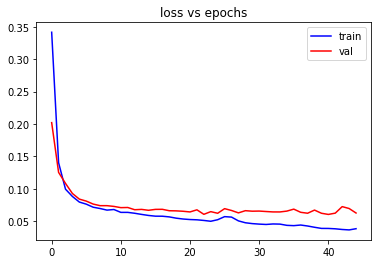

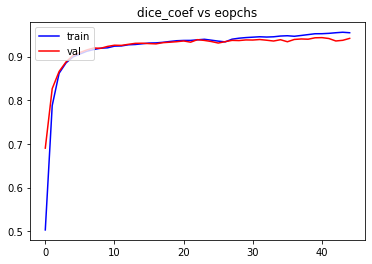

In [14]:
plt.figure()
plt.title('loss vs epochs')
plt.plot(train_loss_list,'b',label='train')
plt.plot(val_loss_list,'r',label='val')
plt.legend(loc='upper right')

plt.figure()
plt.title('dice_coef vs eopchs')
plt.plot(train_dice_coef_list,'b',label='train')
plt.plot(val_dice_coef_list,'r',label='val')
plt.legend(loc='upper left')

plt.show()

In [0]:
torch.save(model.state_dict(),'/content/drive/My Drive/covid19/model.pt')

In [0]:
model=SegNetWithSkipConnections()
model.cuda()
model.load_state_dict(torch.load('/content/drive/My Drive/covid19/model.pt'))
test_preds=[]
val_preds=[]
x_test=torch.tensor(x_test)
x_val=torch.tensor(x_val)

for i in range(len(x_val)):
  val_img=x_val[i].unsqueeze(0)
  val_img=val_img.unsqueeze(0)
  val_img=val_img.type(torch.FloatTensor)
  pred=model(val_img.cuda())
  pred=pred.cpu().data.numpy()
  pred=np.moveaxis(pred,1,-1)
  pred=pred.round().astype(int)
  val_preds.append(pred)

for i in range(len(x_test)):
  test_img=x_test[i].unsqueeze(0)
  test_img=test_img.unsqueeze(0)
  test_img=test_img.type(torch.FloatTensor)
  pred=model(test_img.cuda())
  pred=pred.cpu().data.numpy()
  pred=np.moveaxis(pred,1,-1)
  pred=pred.round().astype(int)
  test_preds.append(pred)

In [0]:
x_val=x_val.cpu().data.numpy()
x_test=x_test.cpu().data.numpy()

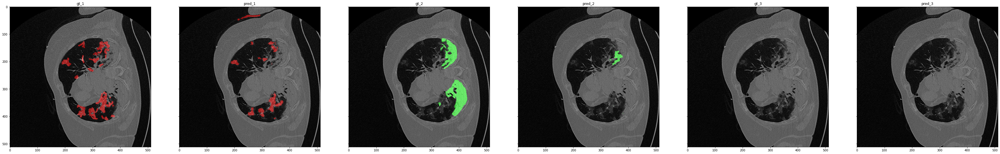

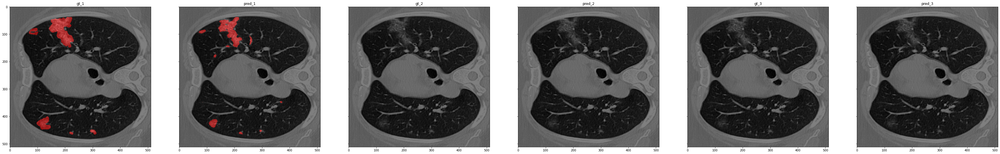

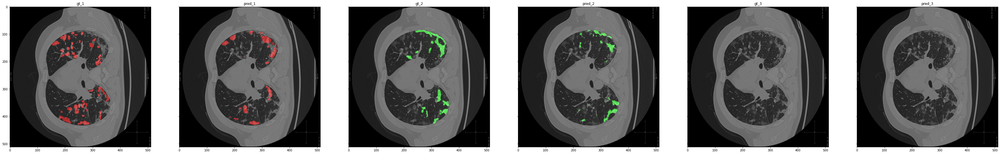

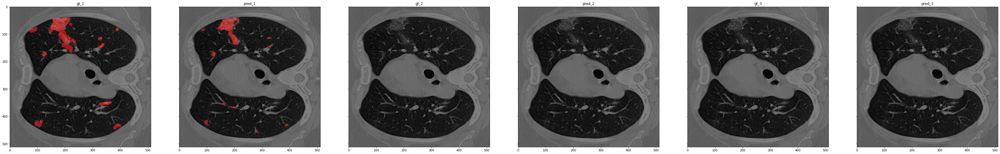

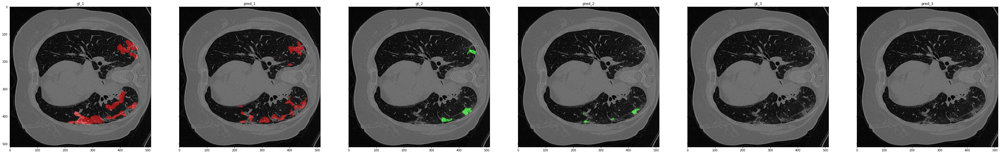

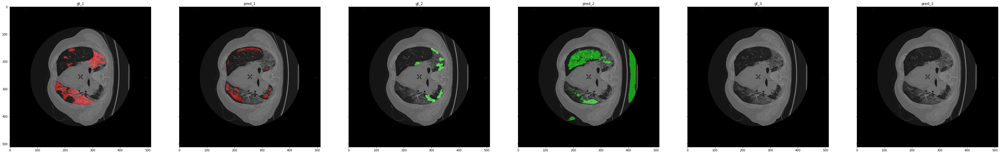

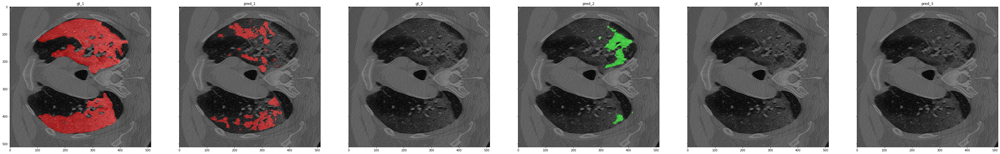

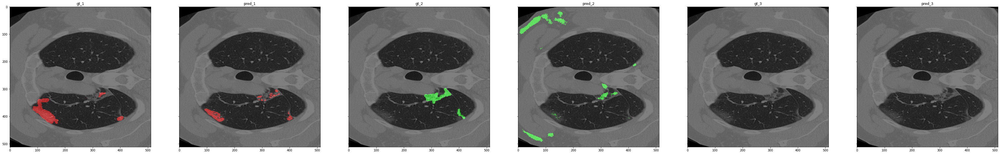

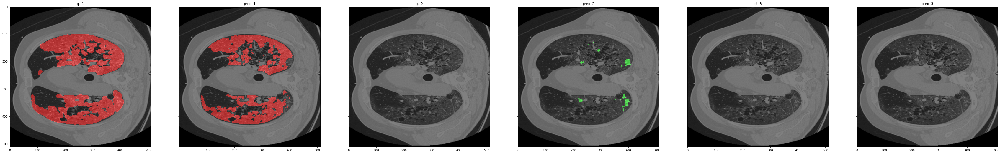

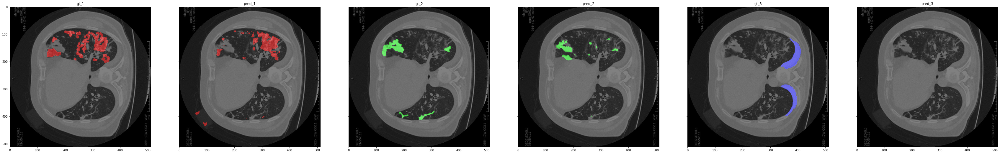

In [50]:
colors_1=[(0,0,0),(1,0,0)]
cm_red=LinearSegmentedColormap.from_list('r_cmap',colors_1,N=2)
colors_2=[(0,0,0),(0,1,0)]
cm_green=LinearSegmentedColormap.from_list('g_cmap',colors_2,N=2)
colors_3=[(0,0,0),(0,0,1)]
cm_blue=LinearSegmentedColormap.from_list('b_cmap',colors_3,N=2)

for i in range(len(val_preds)):
  val_pred=val_preds[i][0,:,:,:]
  f1,(ax1,ax2,ax3,ax4,ax5,ax6)=plt.subplots(1,6,sharey=True,figsize=(60,60))

  ax1.set_title('gt_1')
  ax2.set_title('pred_1')
  ax1.imshow(x_val[i,:,:],cmap='gray')
  ax1.imshow(y_val[i,:,:,1],cmap=cm_red,alpha=0.5)
  ax2.imshow(x_val[i,:,:],cmap='gray')
  ax2.imshow(val_pred[:,:,1],cmap=cm_red,alpha=0.5)

  ax3.set_title('gt_2')
  ax4.set_title('pred_2')
  ax3.imshow(x_val[i,:,:],cmap='gray')
  ax3.imshow(y_val[i,:,:,2],cmap=cm_green,alpha=0.5)
  ax4.imshow(x_val[i,:,:],cmap='gray')
  ax4.imshow(val_pred[:,:,2],cmap=cm_green,alpha=0.5)

  ax5.set_title('gt_3')
  ax6.set_title('pred_3')
  ax5.imshow(x_val[i,:,:],cmap='gray')
  ax5.imshow(y_val[i,:,:,3],cmap=cm_blue,alpha=0.5)
  ax6.imshow(x_val[i,:,:],cmap='gray')
  ax6.imshow(val_pred[:,:,3],cmap=cm_blue,alpha=0.5)

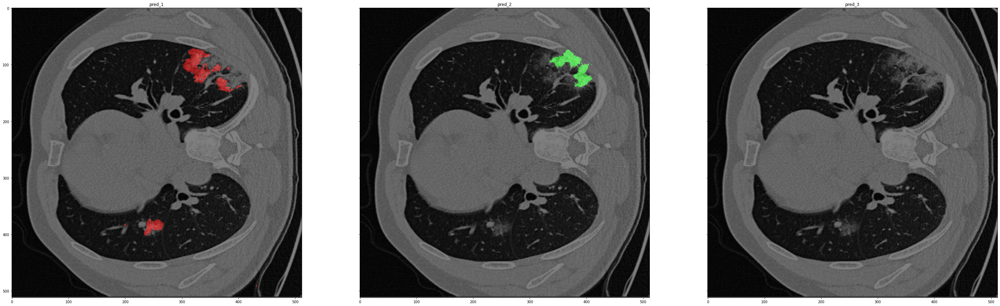

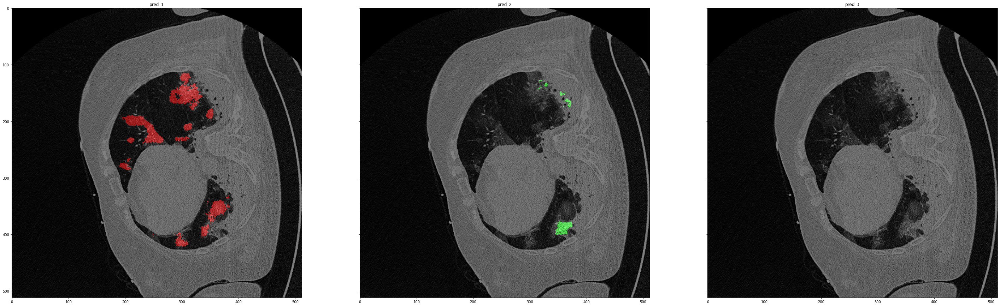

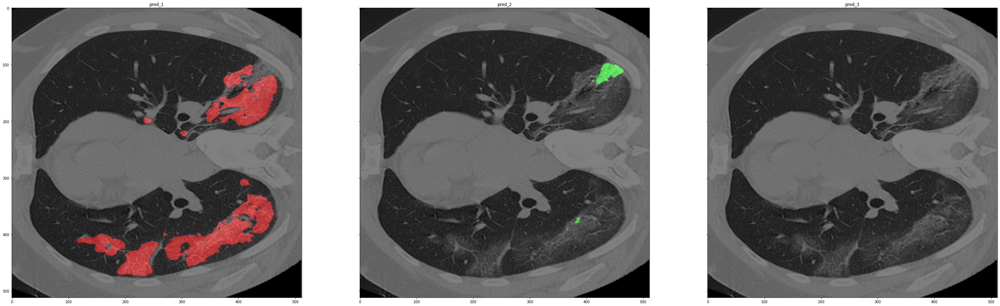

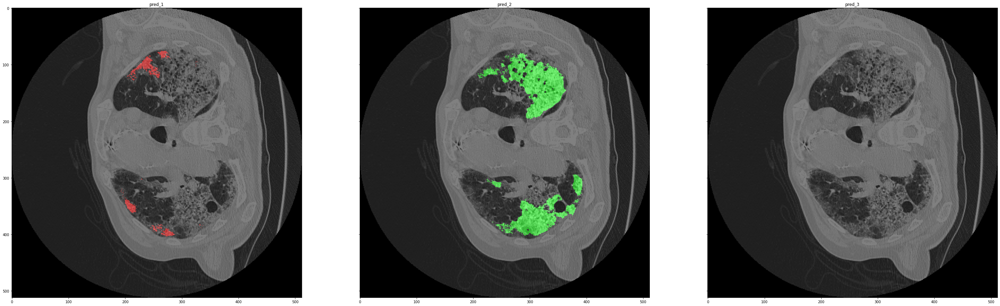

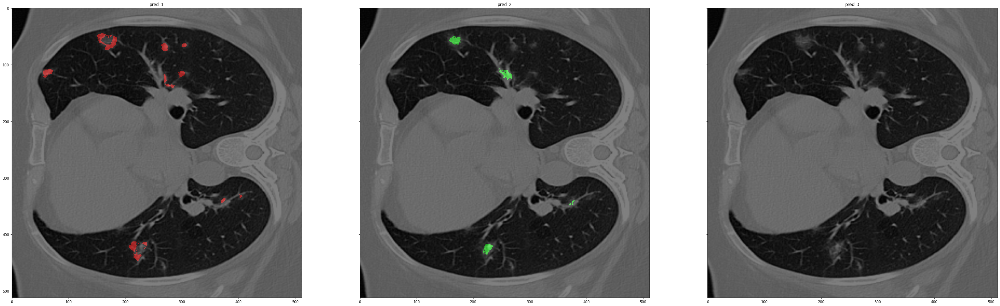

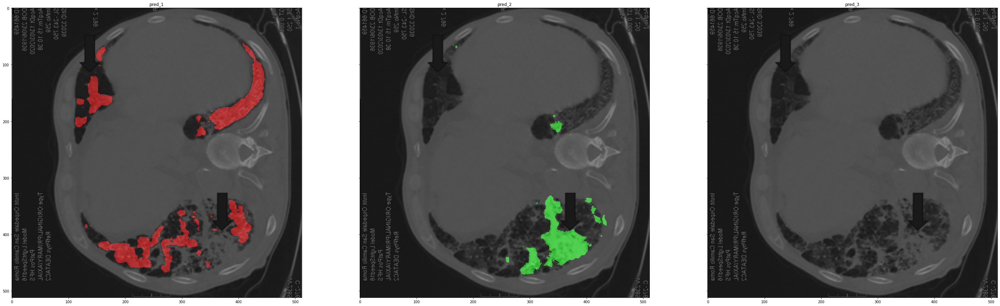

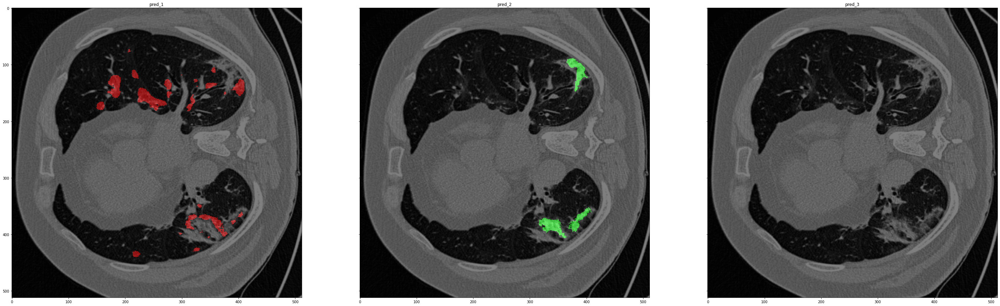

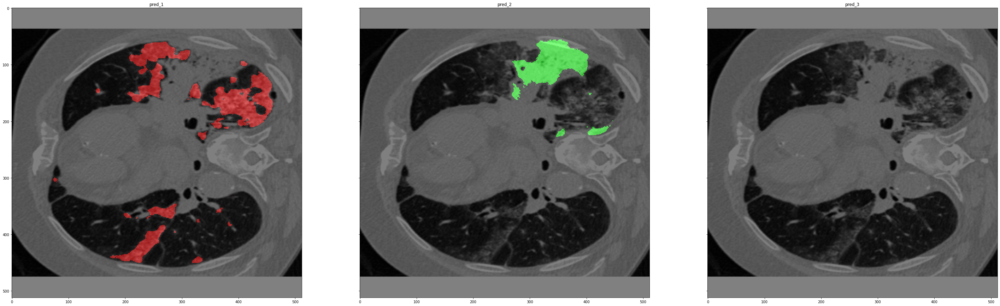

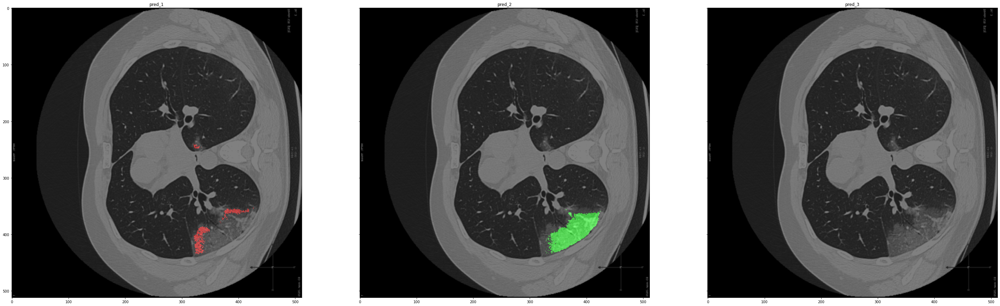

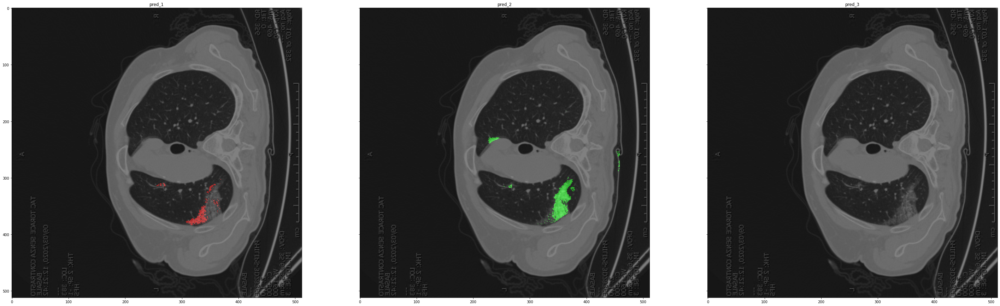

In [51]:
for i in range(len(test_preds)):
  f1,(ax1,ax2,ax3)=plt.subplots(1,3,sharey=True,figsize=(50,30))

  ax1.set_title('pred_1')
  ax1.imshow(x_test[i,:,:],cmap='gray')
  ax1.imshow(test_preds[i][0,:,:,1],cmap=cm_red,alpha=0.5)

  ax2.set_title('pred_2')
  ax2.imshow(x_test[i,:,:],cmap='gray')
  ax2.imshow(test_preds[i][0,:,:,2],cmap=cm_green,alpha=0.5)

  ax3.set_title('pred_3')
  ax3.imshow(x_test[i,:,:],cmap='gray')
  ax3.imshow(test_preds[i][0,:,:,3],cmap=cm_blue,alpha=0.5)